# Code Set Up

In [ ]:
!curl https://cf.10xgenomics.com/samples/cell-exp/3.0.0/pbmc_10k_v3/pbmc_10k_v3_filtered_feature_bc_matrix.h5 -o pbmc_10k_v3_filtered_feature_bc_matrix.h5

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 35.7M  100 35.7M    0     0  54.3M      0 --:--:-- --:--:-- --:--:-- 54.2M


In [ ]:
!pip install scanpy scipy umap-learn leidenalg

In [ ]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import anndata
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.dpi'] = 300
sc.logging.print_header()

scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.23.5 scipy==1.11.4 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.1 igraph==0.11.3 pynndescent==0.5.11


# Data Loading, Exploratory Analysis, & Preprocessing

In [ ]:
ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")
ad10f.shape

(11769, 33538)

Checking For Duplicates

In [ ]:
gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)

True

In [ ]:
duplicates = gname_counts[gname_counts > 1]
print(duplicates)

PDE11A       2
SCO2         2
LINC01505    2
PRSS50       2
ATXN7        2
EMG1         2
CYB561D2     2
LINC01238    2
CCDC39       2
TXNRD3NB     2
ABCF2        2
HSPA14       2
TBCE         2
SOD2         2
RGS5         2
TMSB15B      2
MATR3        2
PINX1        2
POLR2J3      2
DIABLO       2
LINC02203    2
IGF2         2
H2BFS        2
COG8         2
dtype: int64


In [ ]:
ad10f.var_names_make_unique()

Quality Control



In [ ]:
ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

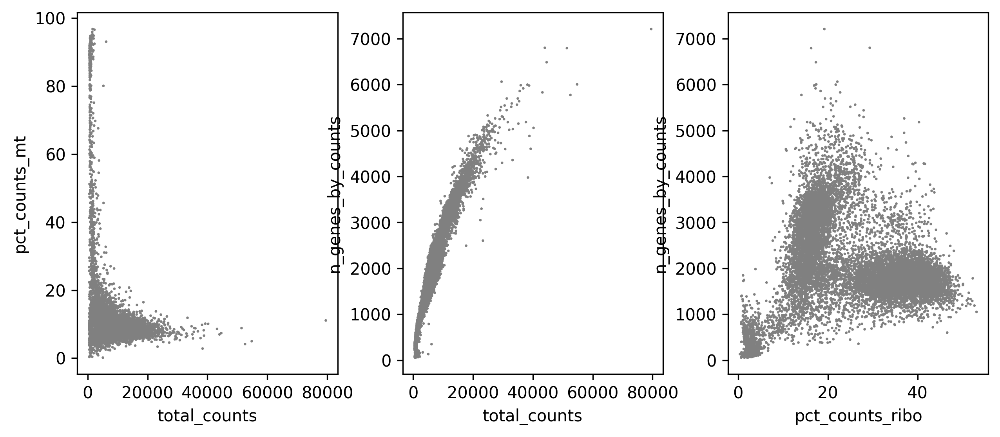

In [ ]:
adClean = ad10f.copy()

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

Basic Filtering
- Keep only cells with < 20% mitochonrially encoded gene total UMIs
- Filtering cells with low # of genes
- Filtering cells with high counts
- Filtering genes that are present in less than 3 cells

In [ ]:
adClean = adClean[adClean.obs['pct_counts_mt']<20,:].copy()
sc.pp.filter_cells(adClean, min_genes=500)
sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

(10891, 20181)

Normalization
- Simple library normalization and log transformation

In [ ]:
adNorm = adClean.copy()
sc.pp.normalize_total(adNorm, target_sum=1e4)
sc.pp.log1p(adNorm)

Highly Variable Genes

In [ ]:
sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var

,gene_ids,feature_types,genome,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,False,60,0.005183,99.490186,61.0,60,False,0.007519,0.595591,-0.001919
AL627309.3,ENSG00000239945,Gene Expression,GRCh38,False,False,4,0.000340,99.966012,4.0,4,False,0.000389,0.144284,-1.366927
AL669831.5,ENSG00000237491,Gene Expression,GRCh38,False,False,679,0.062367,94.230606,734.0,665,False,0.077585,0.586329,-0.029932
FAM87B,ENSG00000177757,Gene Expression,GRCh38,False,False,13,0.001190,99.889540,14.0,13,False,0.001139,0.169543,-1.290532
LINC00115,ENSG00000225880,Gene Expression,GRCh38,False,False,350,0.031269,97.026085,368.0,337,False,0.038579,0.459107,-0.414723
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC011043.1,ENSG00000276256,Gene Expression,GRCh38,False,False,77,0.006882,99.345739,81.0,74,False,0.010262,0.738345,0.429851
AL592183.1,ENSG00000273748,Gene Expression,GRCh38,False,False,32,0.002719,99.728099,32.0,30,False,0.003977,0.799225,0.613985
AC007325.4,ENSG00000278817,Gene Expression,GRCh38,False,False,239,0.020902,97.969241,246.0,233,False,0.023936,0.329110,-0.807909
AL354822.1,ENSG00000278384,Gene Expression,GRCh38,False,False,319,0.028210,97.289489,332.0,303,False,0.038089,0.594378,-0.005588


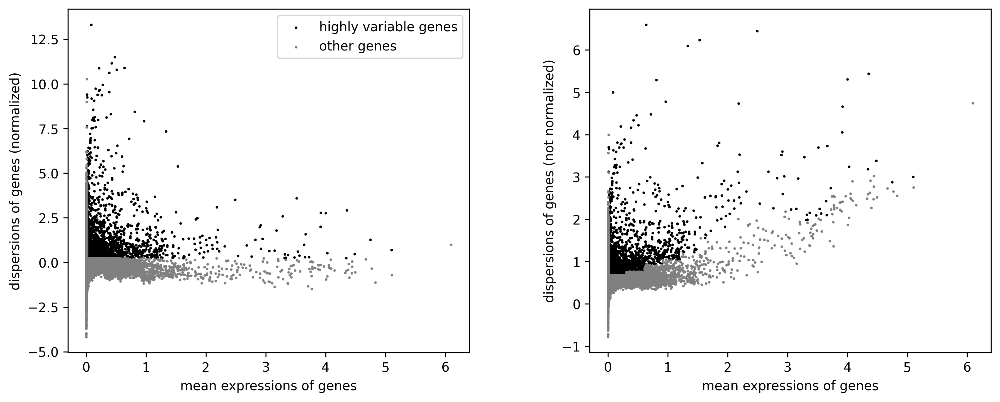

In [ ]:
sc.pl.highly_variable_genes(adNorm)

# PCA

In [ ]:
sc.tl.pca(adNorm , use_highly_variable=True)

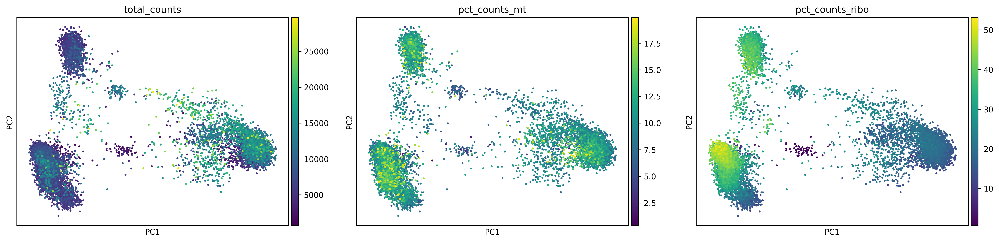

In [ ]:
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)

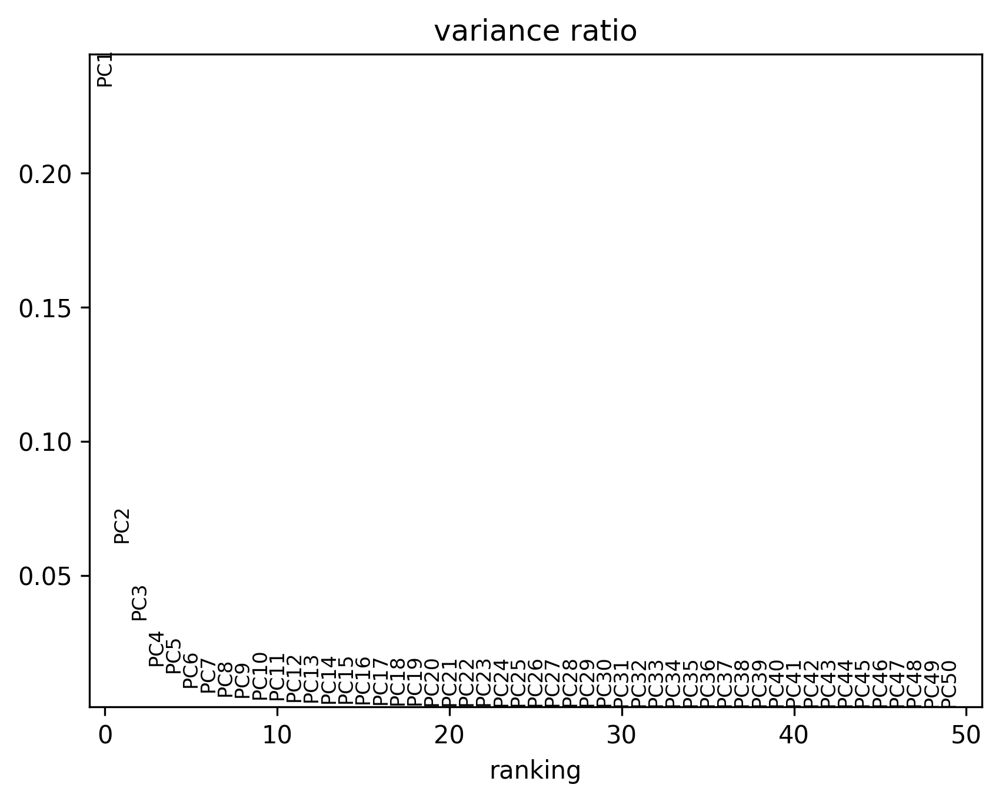

In [ ]:
sc.pl.pca_variance_ratio(adNorm, 50)

# PAGA Analysis

We use PAGA to infer dynamic relationships between clusters and seed an initial embedding for UMAP that reflects overall cluster similarities.

In the next cell, we call the following functions

`tl.paga()` computes intercluster similarities

`pl.paga()` creates an intial embedding based on this

`tl.umap()` uses this embedding to start its optimization

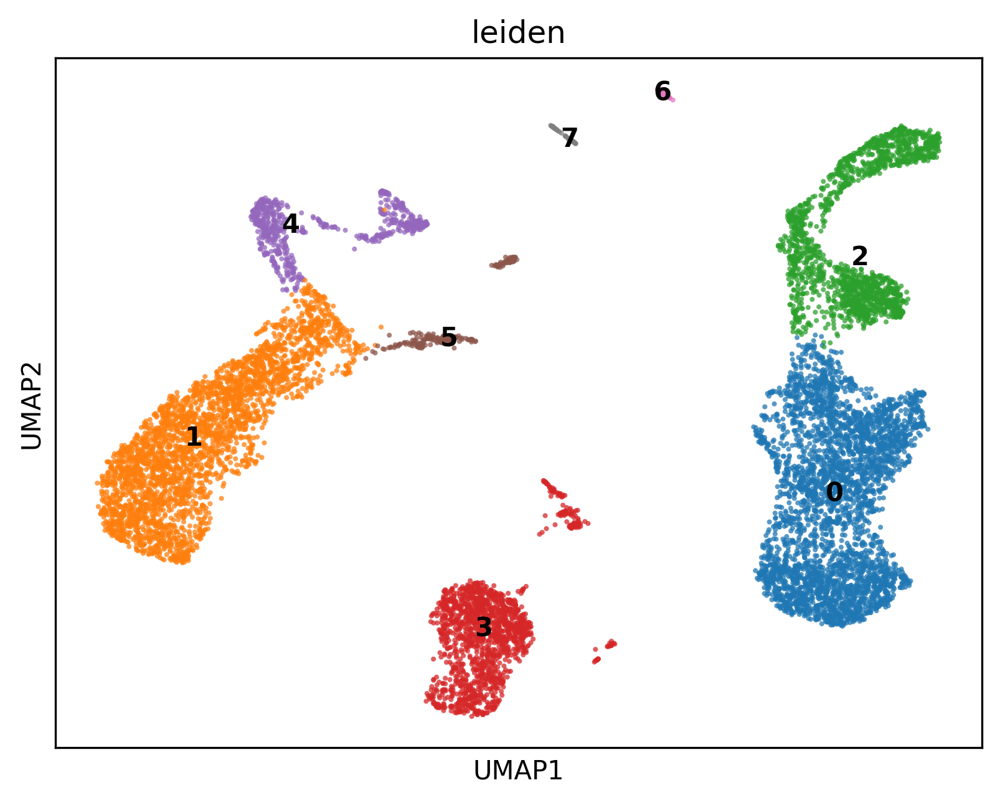

In [ ]:
n_neighbors = 20
n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

# Marker genes and Cluster Annotation
Here PBMC cell types and some genes that have been used to identify them:<br>
**Monocytes**:
  - LYZ (Lysozyme), CD14, CD68
  - sub-types:
    - Classical: CD14, LYZ, S100A8/S100A9, CCR2
    - Intermediate: FCGR3A (CD16), CD163, IL1B
    - non-classical: CX3CR1, FCGR3A (CD16)

**NK cells**:
  - GNLY, GZMB

**B cells**:
  - CD19, CD79A, CD79B

**T cells**:
  - CD3D, CD3E, CD3G

**Dendritic cells**:
  - FLT3, CD1C
  - CLEC4C (plasmacytoid dendritic cell)

categories: 0, 1, 2, etc.
var_group_labels: Monocytes, NK_cells, B_cells, etc.


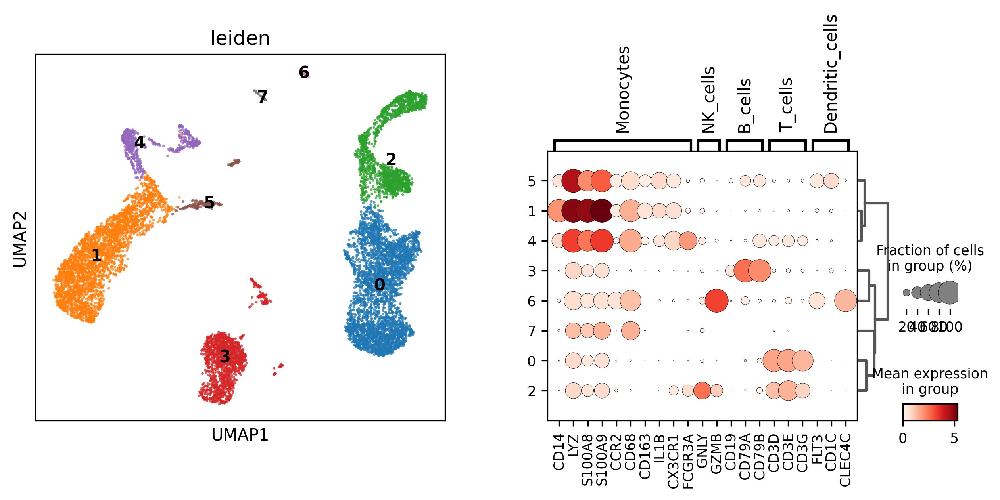

In [ ]:
marker_genes_broad_dict = {
    'Monocytes': ['CD14', 'LYZ', 'S100A8', 'S100A9', 'CCR2', 'CD68', 'CD163', 'IL1B', 'CX3CR1', 'FCGR3A'],
    'NK_cells': ['GNLY', 'GZMB'],
    'B_cells': ['CD19', 'CD79A', 'CD79B'],
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'Dendritic_cells': ['FLT3', 'CD1C', 'CLEC4C']
}
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 5       | B, Dendritic, Mono   | ???             |
| 1       | Monocyte             | Monocyte        |
| 4       | Monocyte, B, T       | ???            |
| 3       | B                    | B-cell          |
| 6       | NK, Dendritic Cell  | ??? |
| 7       | None                 | Mystery cell    |
| 0  | T cell | T cell |
| 2 |  NK, T | ??? |

Clusters to refine are 5, 2, 4, and 6.


### Group 5

categories: 0, 1, 2, etc.
var_group_labels: Monocytes, NK_cells, B_cells, etc.


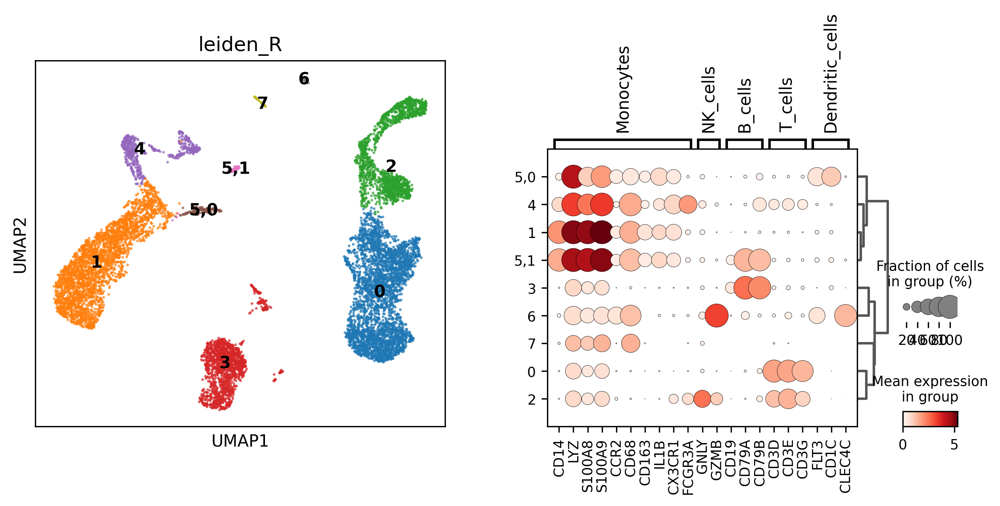

In [ ]:
sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

Cluster 5 is split into 2 clusters now. Both of these sub-clusters express multiple Monocyte markers, but are distinguished by their expression of dendritic and B cell genes. Let's look at the QC metrics to see if that can give us additional hints as to whether these are real cells or are doublets.

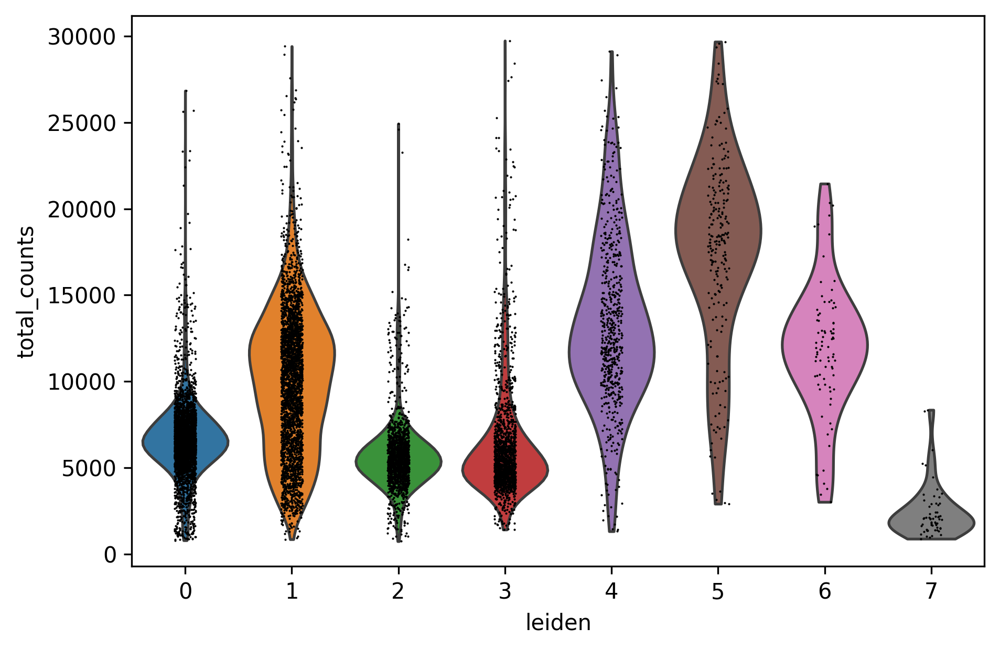

In [ ]:
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden' )

Cluster 5 has a high number of Total counts. So let's annotate these as 'doublet'.

### Group 2

categories: 0, 1, 2,0, etc.
var_group_labels: Monocytes, NK_cells, B_cells, etc.


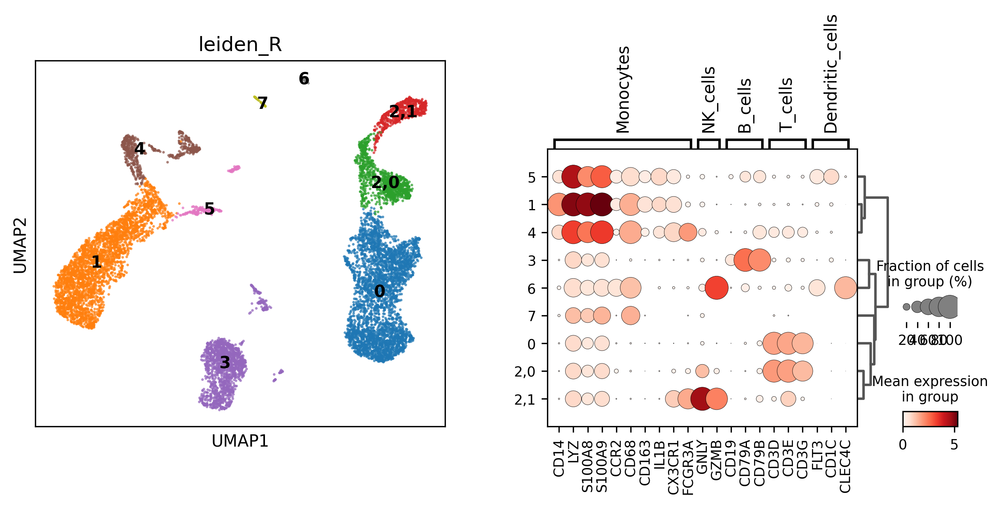

In [ ]:
sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

It looks like 2,0 is T cell, and 2,1 is Natural Killer cell.
Note that 2,0 still has a distinct profile as compared to 0.

### Group 4

categories: 0, 1, 2,0, etc.
var_group_labels: Monocytes, NK_cells, B_cells, etc.


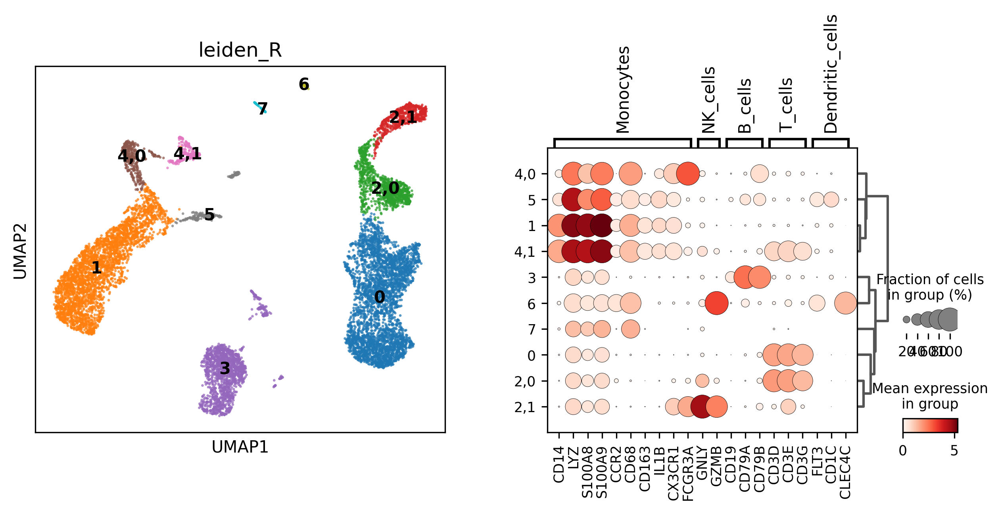

In [ ]:
sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

Is 4,1 multiplet?

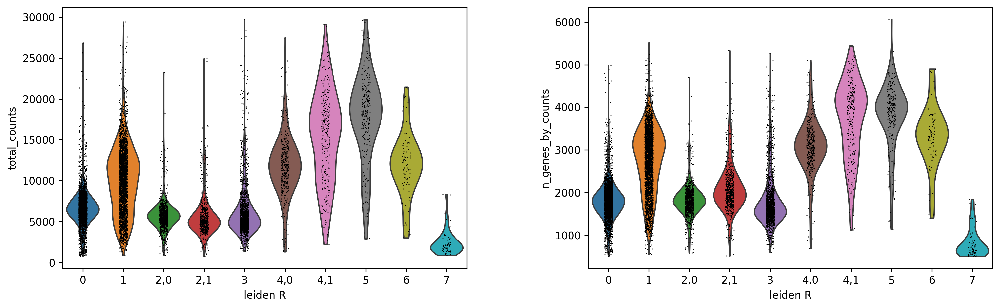

In [ ]:
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

Yes, it looks like 4,1 is similar in these QC profiles to cluster 5.

### Group 6

categories: 0, 1, 2,0, etc.
var_group_labels: Monocytes, NK_cells, B_cells, etc.


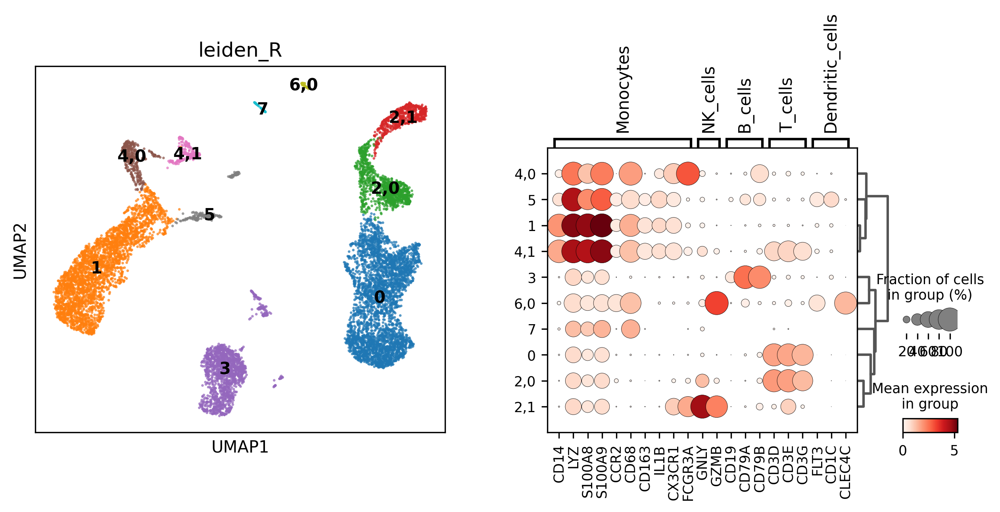

In [ ]:
sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R", ["6"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

Cluster 6 could not be divided into subclusters. Let's see if it's a multiplet.

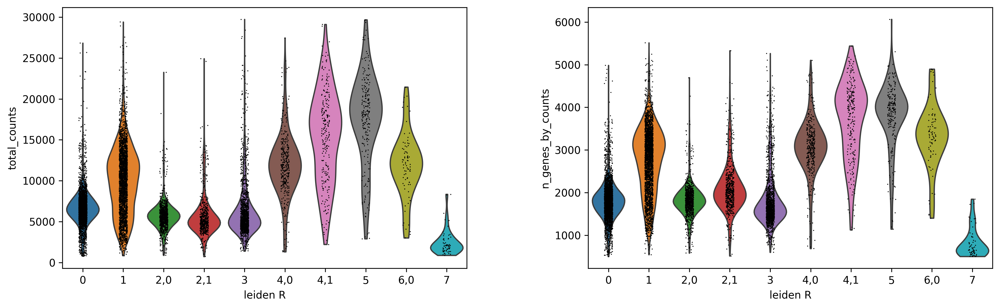

In [ ]:
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

Cluster 6 has a low total_counts and moderate number of genes by count, so it's unlikely to be a doublet. Its profile is unique for expressing both natural killer and dendritic cell markers. Given the lack of any other distinct dendritic cell markers, cluster 6 seems like a good predictor for it.

So our updated annotation table is now:

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 5       | B, Dendritic, Mono   | doublet            |
| 1       | Monocyte             | Monocyte        |
| 4,0     | Monocyte           | Monocyte       |
| 3       | B                    | B-cell          |
| 6       | Dendritic  | Dendritic  |
| 7       | none                 | Mystery cell    |
| 0  | T cell | T cell |
| 2,0  | T cell | T cell |
| 2,1 |  NK cell | NK cell |

Why do we have two Monocyte clusters and two T cells clusters?

categories: 0, 1, 2,0, etc.
var_group_labels: B cell, Dendritic, CD14 monocyte, etc.


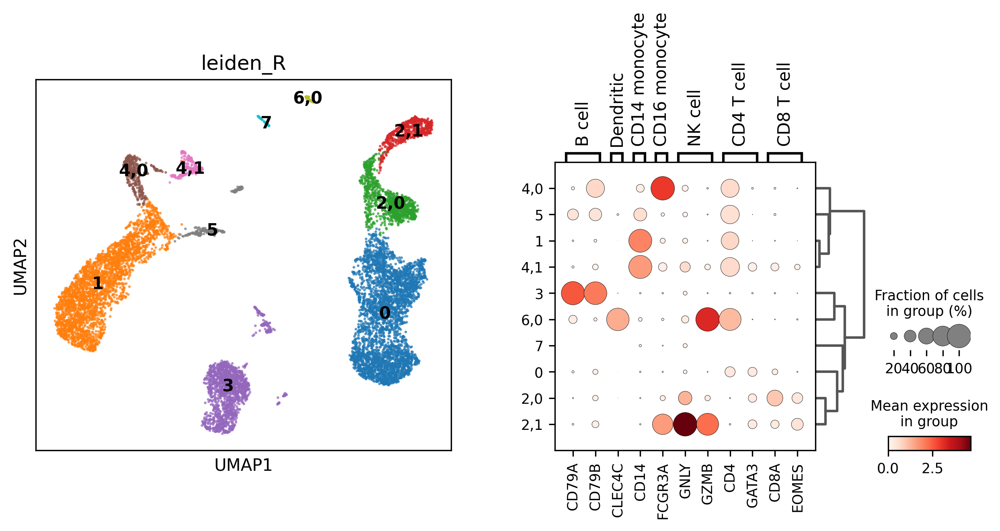

In [ ]:
marker_genes_sub_dict = {
    'B cell': ['CD79A', 'CD79B'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY', 'GZMB'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()


We are close to a final annotation now:

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 5       | B, Dendritic, Mono   | doublet            |
| 1       | Monocyte             | CD14 Monocyte        |
| 4,0     | Monocyte           | CD16 Monocyte       |
| 3       | B                    | B-cell          |
| 6       | Dendritic (NK?)  | Dendritic cell  |
| 7       | none                 | Mystery cell    |
| 0  | T cell | CD4 T cell |
| 2,0 | T cell | CD8 T cell |
| 2,1 |  NK cell | NK cell |

But what is cluster 7? It has low counts. If it is just ambient 'soup', then we would not expect it to have high levels of cell type specific genes. Let's do differential gene expression analysis to see what is upregulated in this cluster.

# Differential Gene Expression

In [ ]:
sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")

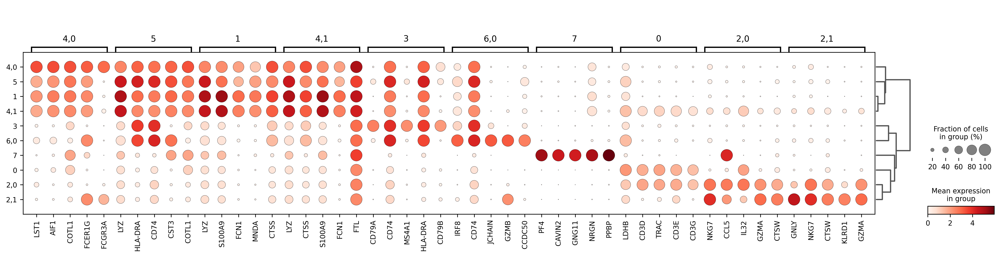

In [ ]:
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')

categories: 0, 1, 2,0, etc.
var_group_labels: 7


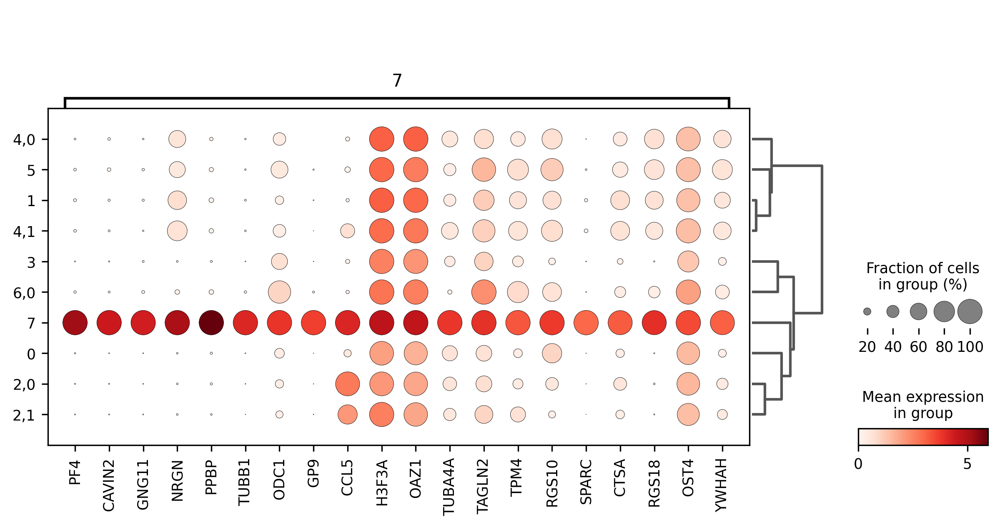

In [ ]:
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

Although this result could be refined and explored a lot, it is likely to be platelet cells.

Now, let's add the annotation to the anndata.obs and discard the other cells

| cluster | markers  of          | cell type       |
|---------|----------------------|-----------------|
| 1       | Monocyte             | CD14 Monocyte        |
| 4,0     | Monocyte           | CD16 Monocyte       |
| 3       | B                    | B-cell          |
| 6       | Dendritic (NK?)  | Dendritic cell  |
| 7       | none                 | Platelet    |
| 0   | T cell | CD4 T cell|
| 2,0 | T cell | CD8 T cell|
| 2,1 |  NK cell | NK cell |

In [ ]:
tokeep = ["1", "4,0", "3", "6,0", "7", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()

0      3557
1      3115
3      1604
2,0    1042
2,1     606
4,0     368
6,0      81
7        60
Name: leiden_R, dtype: int64

# Final Answer to Q1

a) .obs column showing cell types

In [ ]:
cell_dict = {'Dendritic': ['6,0'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")
adNorm2.obs['cell_type']

AAACCCAAGCGCCCAT-1       CD4 T cell
AAACCCACAGAGTTGG-1    CD14 Monocyte
AAACCCACAGGTATGG-1          NK cell
AAACCCACATAGTCAC-1           B cell
AAACCCACATCCAATG-1          NK cell
                          ...      
TTTGTTGGTGCGTCGT-1       CD4 T cell
TTTGTTGGTGTCATGT-1    CD14 Monocyte
TTTGTTGGTTTGAACC-1       CD8 T cell
TTTGTTGTCCAAGCCG-1       CD4 T cell
TTTGTTGTCTTACTGT-1       CD4 T cell
Name: cell_type, Length: 10433, dtype: category
Categories (8, object): ['B cell', 'CD14 Monocyte', 'CD16 Monocyte', 'CD4 T cell', 'CD8 T cell',
                         'Dendritic', 'NK cell', 'Platelet']

b) UMAP with labelled clusters and dotplot with marker gene expression

categories: B cell, CD14 Monocyte, CD16 Monocyte, etc.
var_group_labels: B cell, Dendritic, CD14 monocyte, etc.


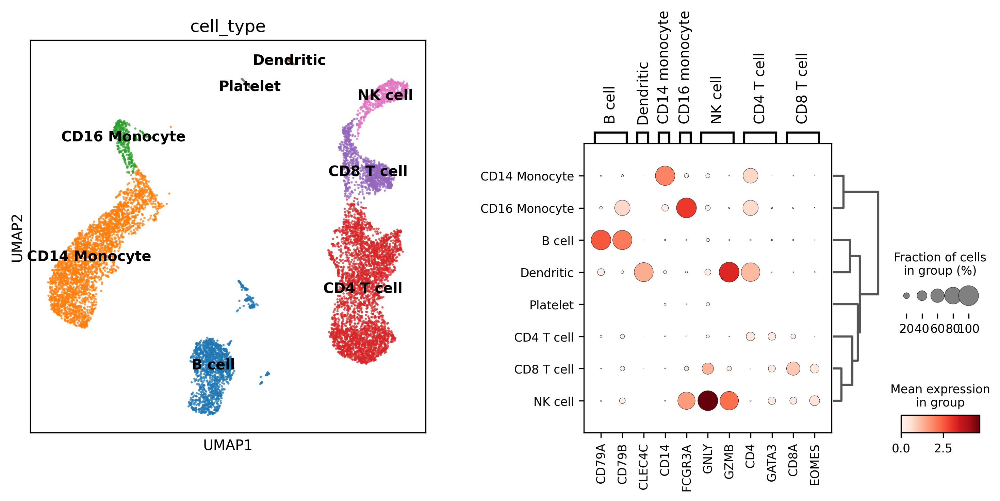

In [ ]:
sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_sub_dict, 'cell_type', dendrogram=True, ax=ax2, show=False)
plt.show()

# Question 2

In [ ]:
def plot_stacked_bar(adata_list):
    num_datasets = len(adata_list)
    x = ['Literature', 'Dataset']
    lit_prop = {
         'T cell': 70,
         'B cell': 15,
         'NK cell': 10,
         'Monocyte': 5,
         'Dendritic': 1,
         'Platelet': 0
    }
    scRNAseq_prop = {cell_type: 0 for cell_type in lit_prop.keys()}

    fig, axs = plt.subplots(num_datasets, figsize=(10,6), gridspec_kw={'wspace':0.4})

    bar_width = 0.35
    opacity = 0.8

    for i, adata in enumerate(adata_list):
      scRNAseq_calc = dict(adata.obs['cell_type'].value_counts() / adata.obs.shape[0] * 100)
      for category in scRNAseq_calc.keys():
        for key in scRNAseq_prop.keys():
          if key in category:
            scRNAseq_prop[key] += scRNAseq_calc[category]

      lit_val = list(lit_prop.values())
      data_val = list(scRNAseq_prop.values())
      bottom = np.zeros(2)
      for j in range(len(lit_val)):
        axs.bar(x[0], lit_val[j], bar_width, bottom = bottom[0], alpha=opacity, label = f'{list(lit_prop.keys())[j]}')
        axs.bar(x[1], data_val[j], bar_width, bottom = bottom[1], alpha=opacity, label = f'{list(scRNAseq_prop.keys())[j]}')
        bottom[0] += lit_val[j]
        bottom[1] += data_val[j]


      axs.set_xlabel('Datasets')
      axs.set_ylabel('Percentage of Cells')
      axs.set_title('Cell Type Proportions')
      axs.legend()


    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

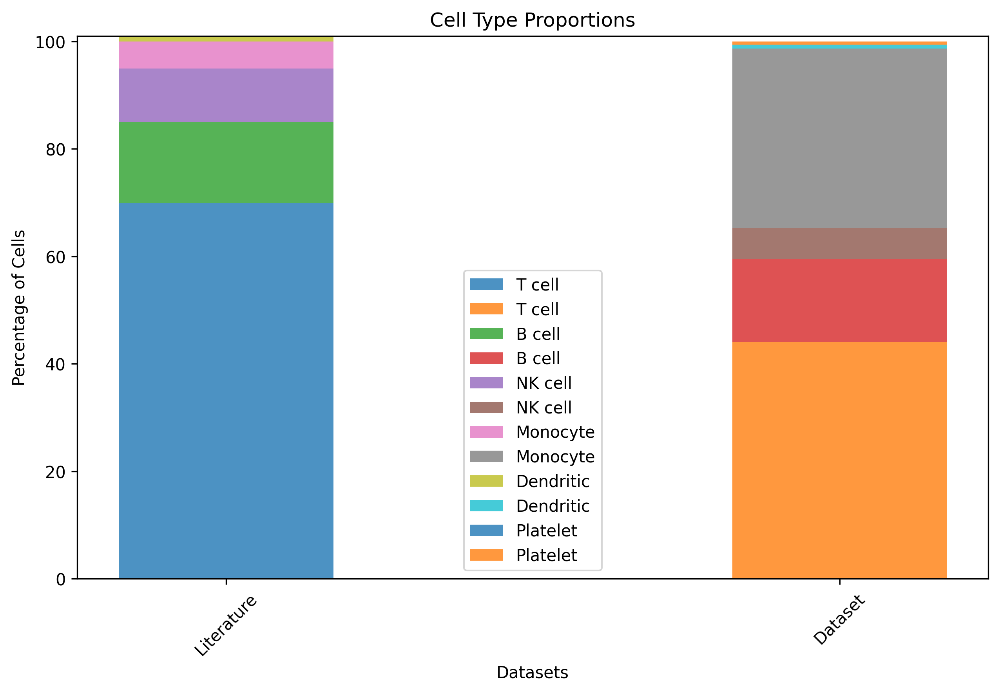

In [ ]:
plot_stacked_bar([adNorm2])

# Question 3

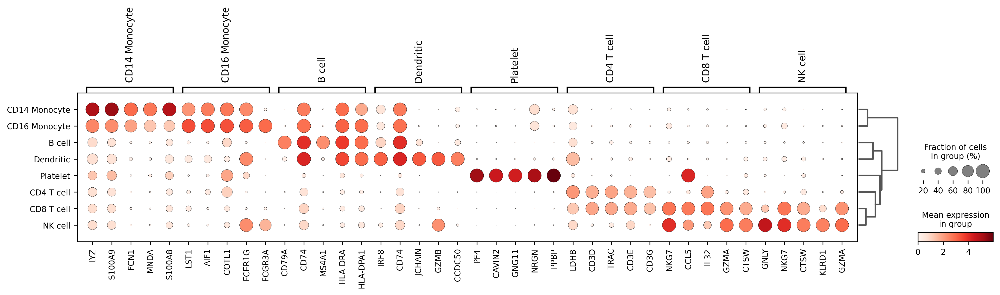

In [ ]:
sc.tl.rank_genes_groups(adNorm2, use_raw=False, groupby='cell_type')
sc.pl.rank_genes_groups_dotplot(adNorm2, n_genes=5, groupby="cell_type", dendrogram=True, key='rank_genes_groups')

In [ ]:
cell_top_genes = {
    'B cell':[],
    'CD14 Monocyte':[],
    'CD16 Monocyte':[],
    'CD4 T cell':[],
    'CD8 T cell':[],
    'NK cell':[],
    'Platelet':[]
}
print("These are the top 5 highest expressed cells by cell type\n")
for i, cell_type in enumerate(list(cell_top_genes.keys())):
  print(cell_type + '\n')
  genes = []
  for j in range(5):
    gene = adNorm2.uns['rank_genes_groups']['names'][j][i]
    genes.append(gene)
    print(f'- {gene}\n')
  cell_top_genes[cell_type] = genes


These are the top 5 highest expressed cells by cell type

B cell

- CD79A

- CD74

- MS4A1

- HLA-DRA

- HLA-DPA1

CD14 Monocyte

- LYZ

- S100A9

- FCN1

- MNDA

- S100A8

CD16 Monocyte

- LST1

- AIF1

- COTL1

- FCER1G

- FCGR3A

CD4 T cell

- LDHB

- CD3D

- TRAC

- CD3E

- CD3G

CD8 T cell

- NKG7

- CCL5

- IL32

- GZMA

- CTSW

NK cell

- IRF8

- CD74

- JCHAIN

- GZMB

- CCDC50

Platelet

- GNLY

- NKG7

- CTSW

- KLRD1

- GZMA



# Question 4

#### No Filtering By MT Counts

In [ ]:
ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")

gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)
duplicates = gname_counts[gname_counts > 1]
print(duplicates)
ad10f.var_names_make_unique()

ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

adClean = ad10f.copy()
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

#adClean[adClean.obs['pct_counts_mt']<20,:].copy()
sc.pp.filter_cells(adClean, min_genes=500)
sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

adNorm = adClean.copy()
sc.pp.normalize_total(adNorm, target_sum=1e4)
sc.pp.log1p(adNorm)

sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var
sc.pl.highly_variable_genes(adNorm)

sc.tl.pca(adNorm , use_highly_variable=True)
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_ribo'], s=25,ncols=3)
sc.pl.pca_variance_ratio(adNorm, 50)

n_neighbors = 20
n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

marker_genes_broad_dict = {
    'Monocytes': ['CD14', 'LYZ', 'S100A8', 'S100A9', 'CCR2', 'CD68', 'CD163', 'IL1B', 'CX3CR1', 'FCGR3A'],
    'NK_cells': ['GNLY', 'GZMB'],
    'B_cells': ['CD19', 'CD79A', 'CD79B'],
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'Dendritic_cells': ['FLT3', 'CD1C', 'CLEC4C']
}
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden_R' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R", ["6"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

marker_genes_sub_dict = {
    'B cell': ['CD79A', 'CD79B'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY', 'GZMB'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

tokeep = ["1", "4,0", "3", "6,0", "7", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()
cell_dict = {'Dendritic': ['6,0'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")
adNorm2.obs['cell_type']

sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_sub_dict, 'cell_type', dendrogram=True, ax=ax2, show=False)
plt.show()


Output hidden; open in https://colab.research.google.com to view.

There are notably different clustering patterns and gene expressions after taking out filtering by mitochondrial counts. Notably, the platelet and dendritic expression clusters are in completely different locations, and the monocyte subtypes seem to have flipped. Additionally, the expression levels for genes related to B cells, Dendritic cells, and monocytes seem to have reduced.

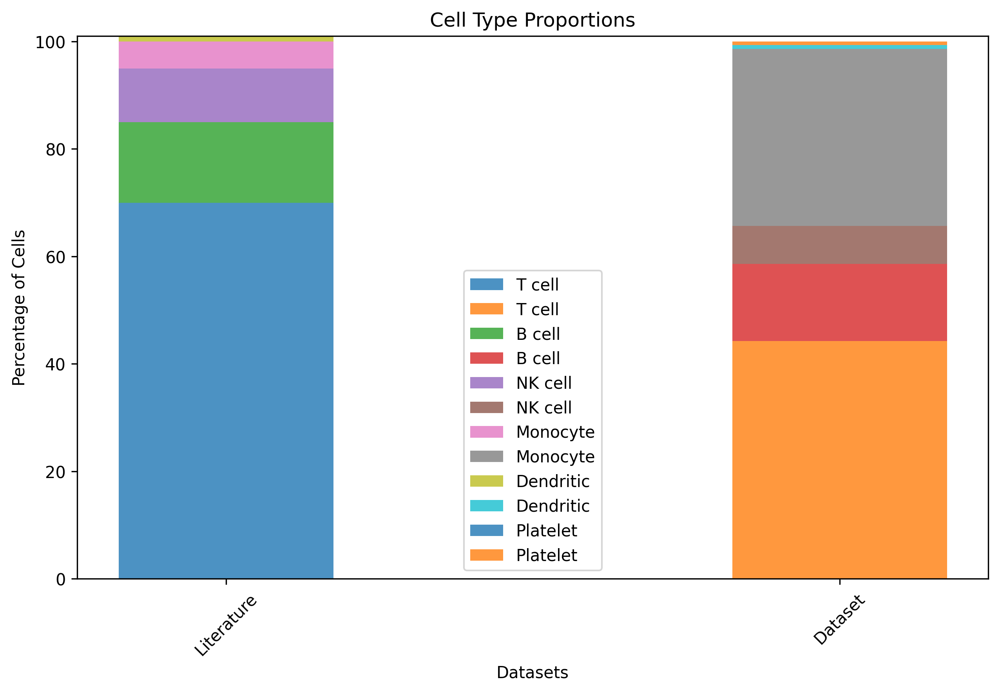

In [ ]:
plot_stacked_bar([adNorm2])

## No Filtering By Total Counts

In [ ]:
ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")

gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)
duplicates = gname_counts[gname_counts > 1]
print(duplicates)
ad10f.var_names_make_unique()

ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

adClean = ad10f.copy()
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

adClean[adClean.obs['pct_counts_mt']<20,:].copy()
sc.pp.filter_cells(adClean, min_genes=500)
#sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

adNorm = adClean.copy()
sc.pp.normalize_total(adNorm, target_sum=1e4)
sc.pp.log1p(adNorm)

sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var
sc.pl.highly_variable_genes(adNorm)

sc.tl.pca(adNorm , use_highly_variable=True)
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)
sc.pl.pca_variance_ratio(adNorm, 50)

n_neighbors = 20
n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

marker_genes_broad_dict = {
    'Monocytes': ['CD14', 'LYZ', 'S100A8', 'S100A9', 'CCR2', 'CD68', 'CD163', 'IL1B', 'CX3CR1', 'FCGR3A'],
    'NK_cells': ['GNLY', 'GZMB'],
    'B_cells': ['CD19', 'CD79A', 'CD79B'],
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'Dendritic_cells': ['FLT3', 'CD1C', 'CLEC4C']
}
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R", ["6"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

marker_genes_sub_dict = {
    'B cell': ['CD79A', 'CD79B'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY', 'GZMB'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

tokeep = ["1", "4,0", "3", "6,0", "7", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()
cell_dict = {'Dendritic': ['6,0'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")
adNorm2.obs['cell_type']

sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_sub_dict, 'cell_type', dendrogram=True, ax=ax2, show=False)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

There are notably different clustering patterns and gene expressions after taking out filtering by total counts. Notably, the platelet and dendritic expression clusters are in completely different locations, and the T + NK cell subtypes seem to have flipped. Additionally, the expression levels for genes related to Dendritic cells seem to have increased.

## No Normalization

In [ ]:
ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")

gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)
duplicates = gname_counts[gname_counts > 1]
print(duplicates)
ad10f.var_names_make_unique()

ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

adClean = ad10f.copy()
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

adClean[adClean.obs['pct_counts_mt']<20,:].copy()
sc.pp.filter_cells(adClean, min_genes=500)
sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

adNorm = adClean.copy()
#sc.pp.normalize_total(adNorm, target_sum=1e4)
#sc.pp.log1p(adNorm)

sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=6, min_disp=0.25, flavor = 'cell_ranger')
adNorm.var
sc.pl.highly_variable_genes(adNorm)

sc.tl.pca(adNorm , use_highly_variable=True)
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)
sc.pl.pca_variance_ratio(adNorm, 50)

n_neighbors = 20
n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

marker_genes_broad_dict = {
    'Monocytes': ['CD14', 'LYZ', 'S100A8', 'S100A9', 'CCR2', 'CD68', 'CD163', 'IL1B', 'CX3CR1', 'FCGR3A'],
    'NK_cells': ['GNLY', 'GZMB'],
    'B_cells': ['CD19', 'CD79A', 'CD79B'],
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'Dendritic_cells': ['FLT3', 'CD1C', 'CLEC4C']
}
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R", ["6"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

marker_genes_sub_dict = {
    'B cell': ['CD79A', 'CD79B'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY', 'GZMB'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')
#sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

tokeep = ["1", "4,0", "3", '7', "6,0", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()
cell_dict = {'Dendritic': ['6,0'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")
adNorm2.obs['cell_type']

sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_sub_dict, 'cell_type', dendrogram=True, ax=ax2, show=False)
plt.show()


Output hidden; open in https://colab.research.google.com to view.

There are notably different clustering patterns and gene expressions after taking out normalization. Every clusters seems to have taken up completely different locations and sizes. Additionally, the expression levels for all genes seem to be masked by a higher scale (mean expression in group extending to 50 now rather than 2.5).

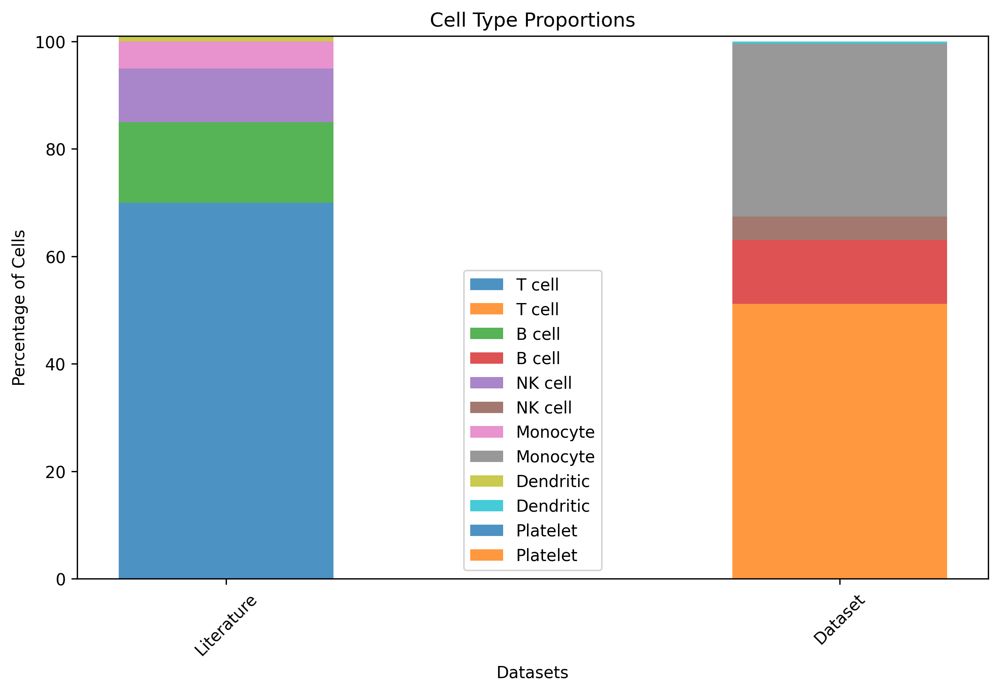

In [ ]:
plot_stacked_bar([adNorm2])

## Extreme n_pcs

In [ ]:
ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")

gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)
duplicates = gname_counts[gname_counts > 1]
print(duplicates)
ad10f.var_names_make_unique()

ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

adClean = ad10f.copy()
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

adClean[adClean.obs['pct_counts_mt']<20,:].copy()
sc.pp.filter_cells(adClean, min_genes=500)
sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

adNorm = adClean.copy()
sc.pp.normalize_total(adNorm, target_sum=1e4)
sc.pp.log1p(adNorm)

sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var
sc.pl.highly_variable_genes(adNorm)

sc.tl.pca(adNorm , use_highly_variable=True)
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)
sc.pl.pca_variance_ratio(adNorm, 50)

n_neighbors = 20
n_pcs = 3
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

marker_genes_broad_dict = {
    'Monocytes': ['CD14', 'LYZ', 'S100A8', 'S100A9', 'CCR2', 'CD68', 'CD163', 'IL1B', 'CX3CR1', 'FCGR3A'],
    'NK_cells': ['GNLY', 'GZMB'],
    'B_cells': ['CD19', 'CD79A', 'CD79B'],
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'Dendritic_cells': ['FLT3', 'CD1C', 'CLEC4C']
}
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R", ["6"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

marker_genes_sub_dict = {
    'B cell': ['CD79A', 'CD79B'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY', 'GZMB'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')
#sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

tokeep = ["1", "4,0", "3", "6,0", "7", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()
cell_dict = {'Dendritic': ['6,0'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")
adNorm2.obs['cell_type']

sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_sub_dict, 'cell_type', dendrogram=True, ax=ax2, show=False)
plt.show()


Output hidden; open in https://colab.research.google.com to view.

There are notably different clustering patterns and gene expressions after inputting an extreme number of principal components. Notably, the clusters seem to have grown far larger and homogenous with less to tell them apart. Additionally, the expression levels for genes such as CD79A and CD79B seem to have dramatically increased in those labeled as B cells.

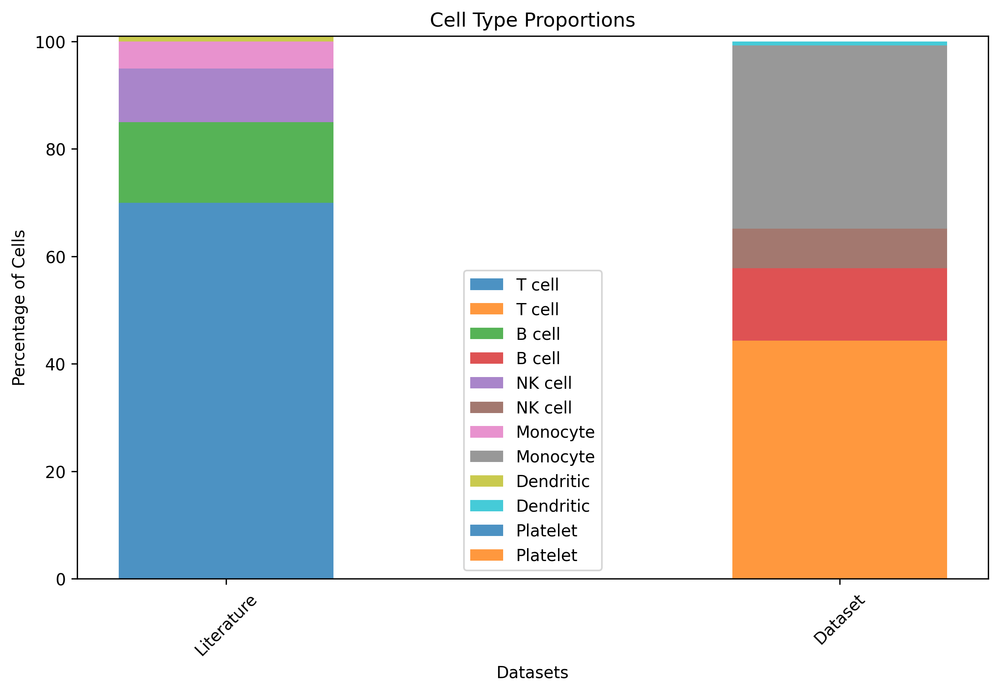

In [ ]:
plot_stacked_bar([adNorm2])

## Extreme n_neighbors

In [ ]:
ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")

gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)
duplicates = gname_counts[gname_counts > 1]
print(duplicates)
ad10f.var_names_make_unique()

ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

adClean = ad10f.copy()
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

adClean[adClean.obs['pct_counts_mt']<20,:].copy()
sc.pp.filter_cells(adClean, min_genes=500)
sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

adNorm = adClean.copy()
sc.pp.normalize_total(adNorm, target_sum=1e4)
sc.pp.log1p(adNorm)

sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var
sc.pl.highly_variable_genes(adNorm)

sc.tl.pca(adNorm , use_highly_variable=True)
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)
sc.pl.pca_variance_ratio(adNorm, 50)

n_neighbors = 3
n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors, n_pcs=n_pcs)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

marker_genes_broad_dict = {
    'Monocytes': ['CD14', 'LYZ', 'S100A8', 'S100A9', 'CCR2', 'CD68', 'CD163', 'IL1B', 'CX3CR1', 'FCGR3A'],
    'NK_cells': ['GNLY', 'GZMB'],
    'B_cells': ['CD19', 'CD79A', 'CD79B'],
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'Dendritic_cells': ['FLT3', 'CD1C', 'CLEC4C']
}
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R", ["6"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

marker_genes_sub_dict = {
    'B cell': ['CD79A', 'CD79B'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY', 'GZMB'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')
#sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

tokeep = ["1", "4,0", "3", "6,0", "7", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()
cell_dict = {'Dendritic': ['6,0'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")
adNorm2.obs['cell_type']

sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_sub_dict, 'cell_type', dendrogram=True, ax=ax2, show=False)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

There are notably different clustering patterns and gene expressions after dramatically lowering the number of neighbors. Rather than islands of distinguishable clusters, groups seem to melt into each other more & are far more spread out. Additionally, the expression levels for genes related to NK cells seem to have decreased.

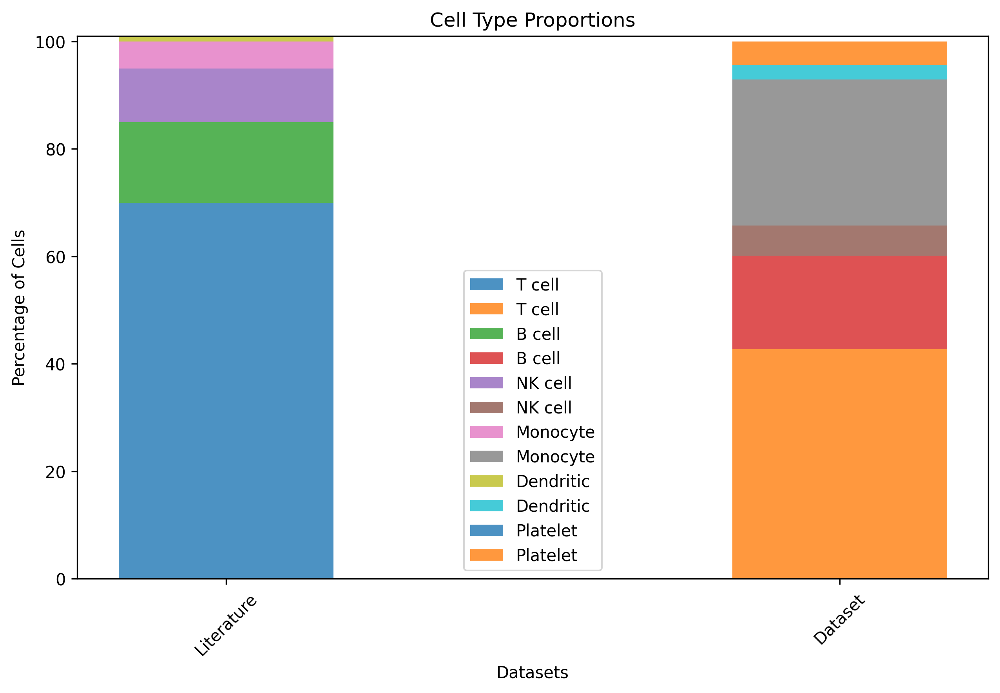

In [ ]:
plot_stacked_bar([adNorm2])

## No PCs

In [ ]:
ad10f = sc.read_10x_h5("pbmc_10k_v3_filtered_feature_bc_matrix.h5")

gname_counts = ad10f.var_names.value_counts()
np.any(gname_counts>1)
duplicates = gname_counts[gname_counts > 1]
print(duplicates)
ad10f.var_names_make_unique()

ad10f.var['mt'] = ad10f.var_names.str.startswith('MT-')
ribo_prefix = ("RPS","RPL")
ad10f.var['ribo'] = ad10f.var_names.str.startswith(ribo_prefix)
sc.pp.calculate_qc_metrics(ad10f, qc_vars=['mt','ribo'], percent_top=None, log1p=False, inplace=True)

adClean = ad10f.copy()
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.scatter(adClean, x='total_counts', y='pct_counts_mt', ax=ax1, show=False)
ax2_dict = sc.pl.scatter(adClean, x='total_counts', y='n_genes_by_counts',ax=ax2, show=False)
ax3_dict = sc.pl.scatter(adClean, x='pct_counts_ribo', y='n_genes_by_counts',ax=ax3, show=False)
plt.show()

adClean[adClean.obs['pct_counts_mt']<20,:].copy()
sc.pp.filter_cells(adClean, min_genes=500)
sc.pp.filter_cells(adClean, max_counts=30000)
sc.pp.filter_genes(adClean, min_cells=3)
adClean.shape

adNorm = adClean.copy()
sc.pp.normalize_total(adNorm, target_sum=1e4)
sc.pp.log1p(adNorm)

sc.pp.highly_variable_genes(adNorm, min_mean=0.0125, max_mean=6, min_disp=0.25)
adNorm.var
sc.pl.highly_variable_genes(adNorm)

sc.tl.pca(adNorm , use_highly_variable=True)
sc.pl.pca(adNorm, color=['total_counts', 'pct_counts_mt', 'pct_counts_ribo'], s=25,ncols=3)
sc.pl.pca_variance_ratio(adNorm, 50)

n_neighbors = 20
#n_pcs = 10
sc.pp.neighbors(adNorm, n_neighbors=n_neighbors)
sc.tl.leiden(adNorm,.1)
sc.tl.paga(adNorm)
sc.pl.paga(adNorm, plot=False)
sc.tl.umap(adNorm, 0.25, init_pos='paga')
sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=15, legend_loc='on data')

marker_genes_broad_dict = {
    'Monocytes': ['CD14', 'LYZ', 'S100A8', 'S100A9', 'CCR2', 'CD68', 'CD163', 'IL1B', 'CX3CR1', 'FCGR3A'],
    'NK_cells': ['GNLY', 'GZMB'],
    'B_cells': ['CD19', 'CD79A', 'CD79B'],
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'Dendritic_cells': ['FLT3', 'CD1C', 'CLEC4C']
}
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["5"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts'], groupby='leiden' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden",["2"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R",["4"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

sc.tl.leiden(adNorm,.1, restrict_to=["leiden_R", ["6"]])
sc.tl.dendrogram(adNorm, "leiden_R")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_broad_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()
sc.pl.violin(adNorm, ['total_counts', 'n_genes_by_counts'], groupby='leiden_R' )

marker_genes_sub_dict = {
    'B cell': ['CD79A', 'CD79B'],
    'Dendritic': ['CLEC4C'],
    'CD14 monocyte': ['CD14'],
    'CD16 monocyte': ['FCGR3A'],
    'NK cell': ['GNLY', 'GZMB'],
    'CD4 T cell': ['CD4', 'GATA3'],
    'CD8 T cell': ['CD8A', 'EOMES']
}

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4), gridspec_kw={'wspace':0.25})
ax1_dict = sc.pl.umap(adNorm,color=['leiden_R'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm, marker_genes_sub_dict, 'leiden_R', dendrogram=True,ax=ax2, show=False)
plt.show()

sc.tl.rank_genes_groups(adNorm, use_raw=False, groupby="leiden_R")
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=5, groupby="leiden_R", dendrogram=True, key='rank_genes_groups')
sc.pl.rank_genes_groups_dotplot(adNorm, n_genes=20, groupby="leiden_R", dendrogram=True, key='rank_genes_groups', groups=['7'])

tokeep = ["1", "4,0", "3", "6,0", "7", "0", "2,0", "2,1"]
adNorm2 = adNorm.copy()
adNorm2 = adNorm2[adNorm2.obs['leiden_R'].isin(tokeep)].copy()
adNorm2.shape
adNorm2.obs['leiden_R'].value_counts()
cell_dict = {'Dendritic': ['6,0'],
             'CD14 Monocyte': ['1'],
             'CD16 Monocyte': ["4,0"],
             'B cell': ['3'],
             'Platelet': ['7'],
             'CD4 T cell': ['0'],
             'CD8 T cell': ["2,0"],
             'NK cell': ["2,1"]
}

new_obs_name = 'cell_type'
adNorm2.obs[new_obs_name] = np.nan

for i in cell_dict.keys():
    ind = pd.Series(adNorm2.obs.leiden_R).isin(cell_dict[i])
    adNorm2.obs.loc[ind,new_obs_name] = i

adNorm2.obs['cell_type'] = adNorm2.obs['cell_type'].astype("category")
adNorm2.obs['cell_type']

sc.tl.dendrogram(adNorm2, "cell_type")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,5), gridspec_kw={'wspace':0.4})
ax1_dict = sc.pl.umap(adNorm2,color=['cell_type'], alpha=.75, s=10, legend_loc='on data', ax=ax1, show=False)
ax2_dict = sc.pl.dotplot(adNorm2, marker_genes_sub_dict, 'cell_type', dendrogram=True, ax=ax2, show=False)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

There are notably different clustering patterns and gene expressions after removing all principal components. Notably, dendritic cell expression seems to mirror monocyte expression, and there is a larger disparity between CD4 and CD8 T cells. Additionally, the expression levels of genes CD79A and CD79B in cells labeled B cells seems to have dramatically increased.

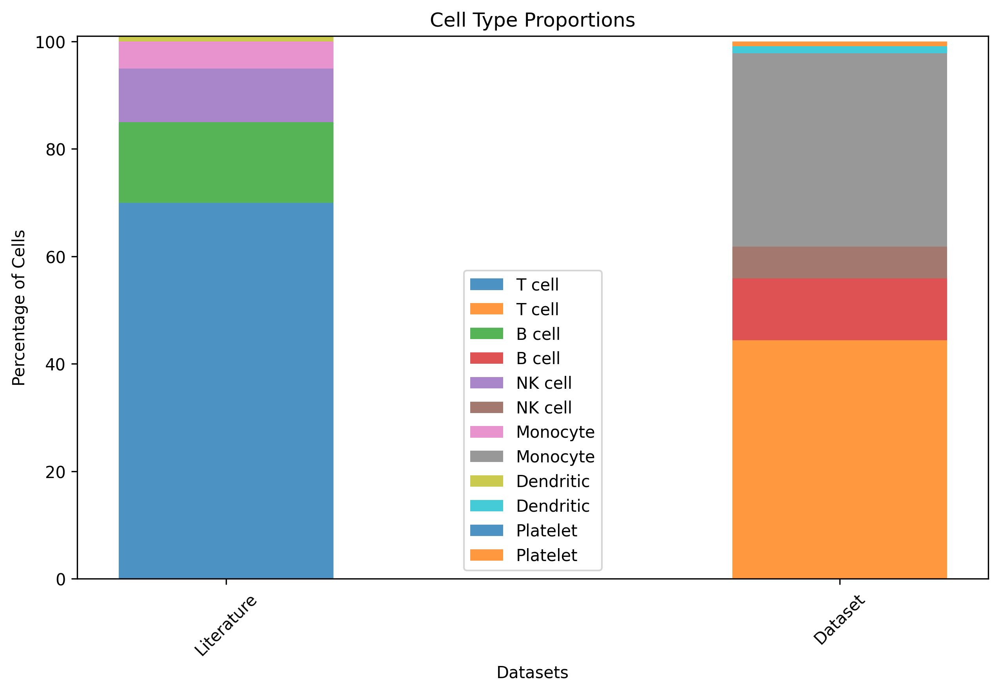

In [ ]:
plot_stacked_bar([adNorm2])